# Useful imports

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import mplcyberpunk
import datetime
import numpy as np
from scipy.fft import fft
from scipy.signal import periodogram


In [376]:
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')
from holidays import CountryHoliday
from tqdm import tqdm

In [381]:
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

In [161]:
train

,id,date,country,store,product,num_sold
0,0,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63
1,1,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66
2,2,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9
3,3,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59
4,4,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49
...,...,...,...,...,...,...
136945,136945,2021-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding,700
136946,136946,2021-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs,752
136947,136947,2021-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People,111
136948,136948,2021-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions,641


In [162]:
test

,id,date,country,store,product
0,136950,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding
1,136951,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs
2,136952,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People
3,136953,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions
4,136954,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better
...,...,...,...,...,...
27370,164320,2022-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding
27371,164321,2022-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs
27372,164322,2022-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People
27373,164323,2022-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions


In [4]:
train.describe()

,id,num_sold
count,136950.00000,136950.000000
mean,68474.50000,165.522636
std,39534.20402,183.691575
min,0.00000,2.000000
25%,34237.25000,46.000000
50%,68474.50000,98.000000
75%,102711.75000,184.000000
max,136949.00000,1380.000000


In [5]:
train.country.value_counts()

Argentina    27390
Canada       27390
Estonia      27390
Japan        27390
Spain        27390
Name: country, dtype: int64

In [6]:
train.store.value_counts()

Kaggle Learn    45650
Kaggle Store    45650
Kagglazon       45650
Name: store, dtype: int64

In [7]:
train["product"].unique()

array(['Using LLMs to Improve Your Coding',
       'Using LLMs to Train More LLMs',
       'Using LLMs to Win Friends and Influence People',
       'Using LLMs to Win More Kaggle Competitions',
       'Using LLMs to Write Better'], dtype=object)

In [382]:
train.date = pd.to_datetime(train.date, format = '%Y-%m-%d')
test.date = pd.to_datetime(test.date, format = '%Y-%m-%d')

In [166]:
plt.style.use("cyberpunk")

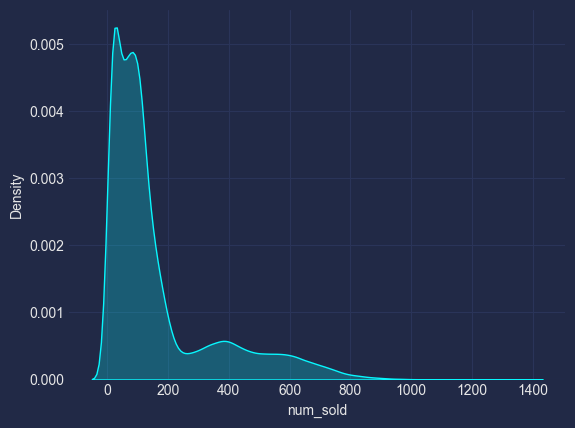

In [167]:
sns.kdeplot(train, x="num_sold", fill=True)
mplcyberpunk.add_glow_effects()

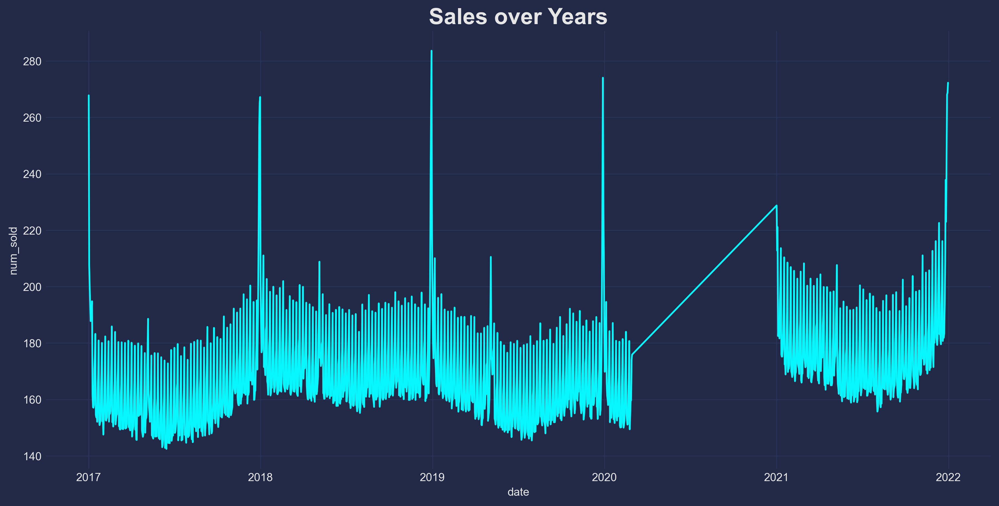

In [552]:
plt.figure(figsize=(15,7), dpi=300)
sns.lineplot(train, x="date", y="num_sold", errorbar=None)
plt.title("Sales over Years", fontsize=20, fontweight="bold")
plt.show()

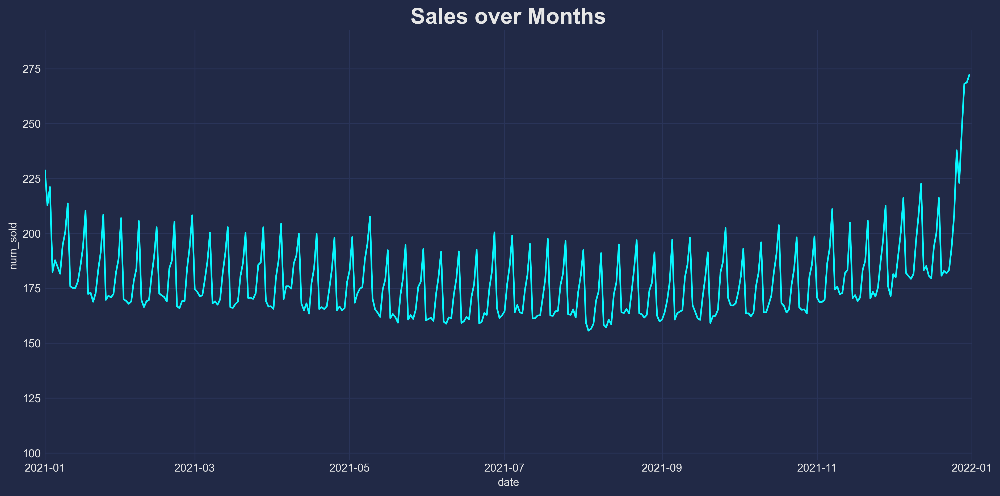

In [169]:
plt.figure(figsize=(15,7), dpi=300)
sns.lineplot(train, x="date", y="num_sold", errorbar=None)
plt.xlim([datetime.date(2021, 1, 1), datetime.date(2022, 1, 1)])
plt.title("Sales over Months", fontsize=20, fontweight="bold")
plt.show()

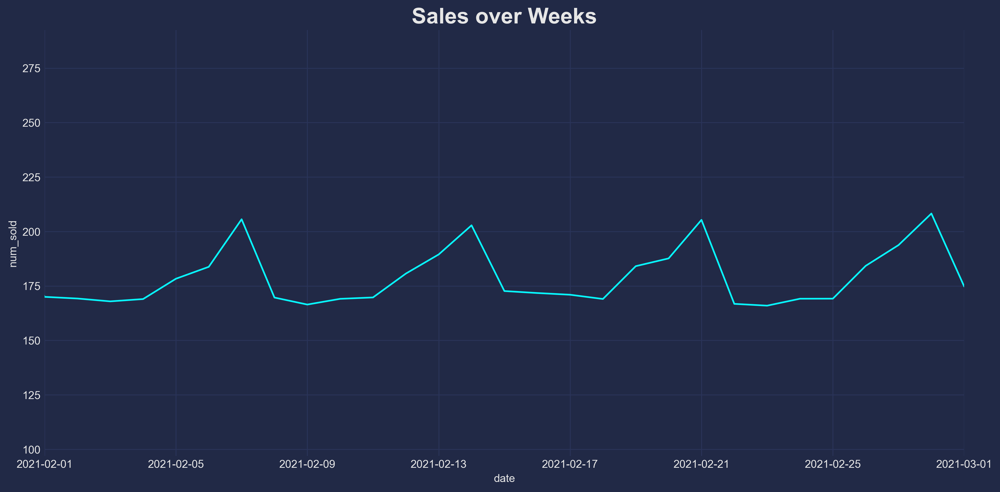

In [170]:
plt.figure(figsize=(15,7), dpi=300)
sns.lineplot(train, x="date", y="num_sold", errorbar=None)
plt.xlim([datetime.date(2021, 2, 1), datetime.date(2021, 3, 1)])
plt.title("Sales over Weeks", fontsize=20, fontweight="bold")
plt.show()

## Finding out the period of fluctuations

We need to know, on what period does the spike in sales occur. To do that we need to know, how many sales are done each day. Using groupby() we can achieve exactly that.

In [171]:
sales_by_day = train.groupby('date')['num_sold'].aggregate('sum')
sales_by_day.head()

date
2017-01-01    20086
2017-01-02    15563
2017-01-03    15039
2017-01-04    14516
2017-01-05    14083
Name: num_sold, dtype: int64

### Using FFT

In [172]:
def fft_period(series):
    yf=fft(series)
    xf = np.linspace(0.0, 1.0/(2.0), len(series)//2)
    idx = np.argmax(np.abs(yf[1:len(series)//2]))
    freq = xf[idx]
    period = 1/freq
    return(period)
fft_period(sales_by_day)

7.015384615384615

### Using periodogram

6.996168582375479


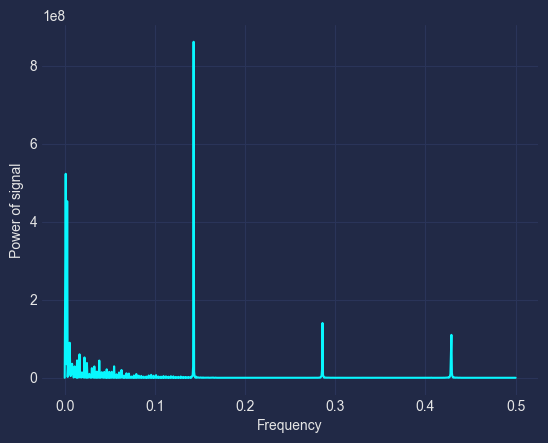

In [173]:
def periodgram_period(series):
    freq, power = periodogram(series)
    period = 1/freq[np.argmax(power)]
    print(period)
    plt.plot(freq, power)
    plt.xlabel("Frequency")
    plt.ylabel("Power of signal")
    plt.show()
periodgram_period(sales_by_day)

As we can see our hypothesis about period being one week is correct. Now let's see if there is any periodic behaviour on a month-scale.

In [174]:
sales_by_month = train.groupby(pd.Grouper(key='date',freq='M'))['num_sold'].aggregate('sum')
sales_by_month.head()

date
2017-01-31    401396
2017-02-28    338179
2017-03-31    368364
2017-04-30    357268
2017-05-31    365720
Freq: M, Name: num_sold, dtype: int64

In [175]:
sales_by_month= sales_by_month[:36]**2


In [176]:
sales_by_month

date
2017-01-31    161118748816
2017-02-28    114365036041
2017-03-31    135692036496
2017-04-30    127640423824
2017-05-31    133751118400
2017-06-30    118273400281
2017-07-31    132621245584
2017-08-31    132632899344
2017-09-30    129256068484
2017-10-31    143831321001
2017-11-30    144190316176
2017-12-31    184487430400
2018-01-31    171429121600
2018-02-28    132021769104
2018-03-31    161307460161
2018-04-30    149525289225
2018-05-31    161911273924
2018-06-30    144587781009
2018-07-31    151689996676
2018-08-31    154978430929
2018-09-30    147967162225
2018-10-31    157979221156
2018-11-30    147255620121
2018-12-31    181998651769
2019-01-31    164645235225
2019-02-28    124948110400
2019-03-31    151362236809
2019-04-30    133794276841
2019-05-31    147462144064
2019-06-30    128187629089
2019-07-31    131370002500
2019-08-31    137585355625
2019-09-30    133287057225
2019-10-31    146702022289
2019-11-30    141334643025
2019-12-31    166980111424
Freq: M, Name: num_sold

12.0


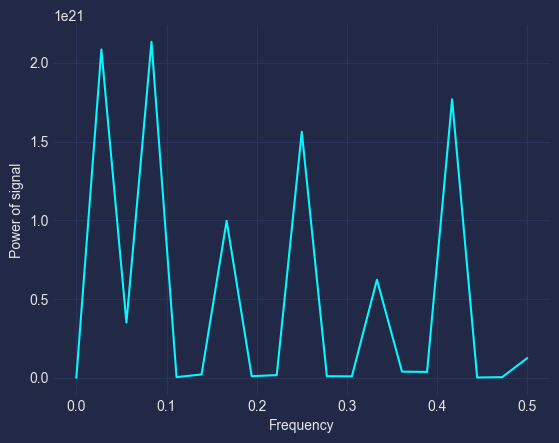

In [177]:
periodgram_period(sales_by_month)

From the plot and basic intuition we can see the pattern emerging: each year behaves more or less the same. Sales are better the closer the winter is. So the period of this pattern is 1 year. But to get that value with the tools that worked for us on a day scale, we need to use some tricks. First of all, to get the period of 12 we need to exclude coronavirus year from the data, because this anomaly really messes everything up. Also, as the total sum of sales for each month does not differntiate that much, we need to square all the values, so that the difference between the variables is more visible

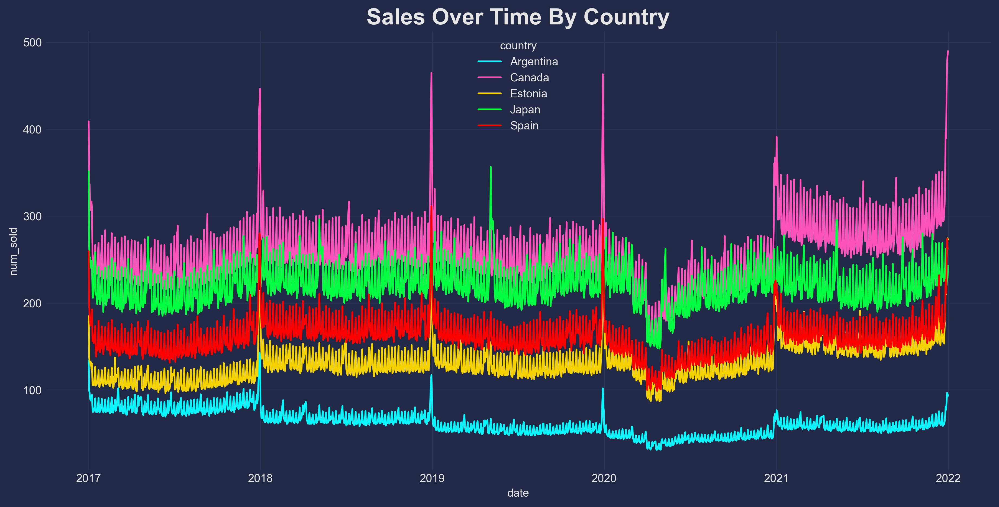

In [178]:
plt.figure(figsize=(15,7), dpi=300)
sns.lineplot(train, x="date", y="num_sold",hue = "country", errorbar=None)
plt.title("Sales Over Time By Country", fontsize=20, fontweight = "bold")
plt.show()

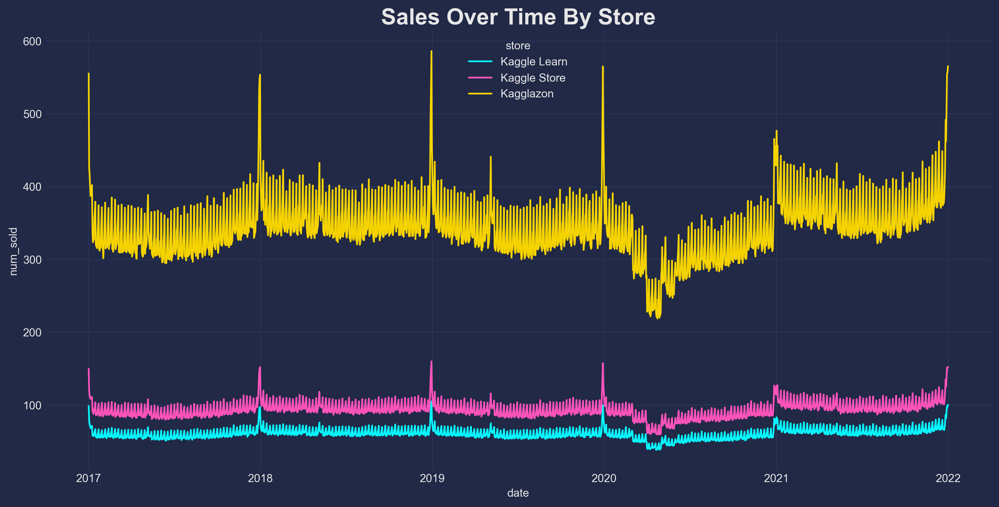

In [179]:
plt.figure(figsize=(15,7), dpi=300)
sns.lineplot(train, x="date", y="num_sold",hue = "store", errorbar=None)
plt.title("Sales Over Time By Store", fontsize=20, fontweight = "bold")
plt.show()

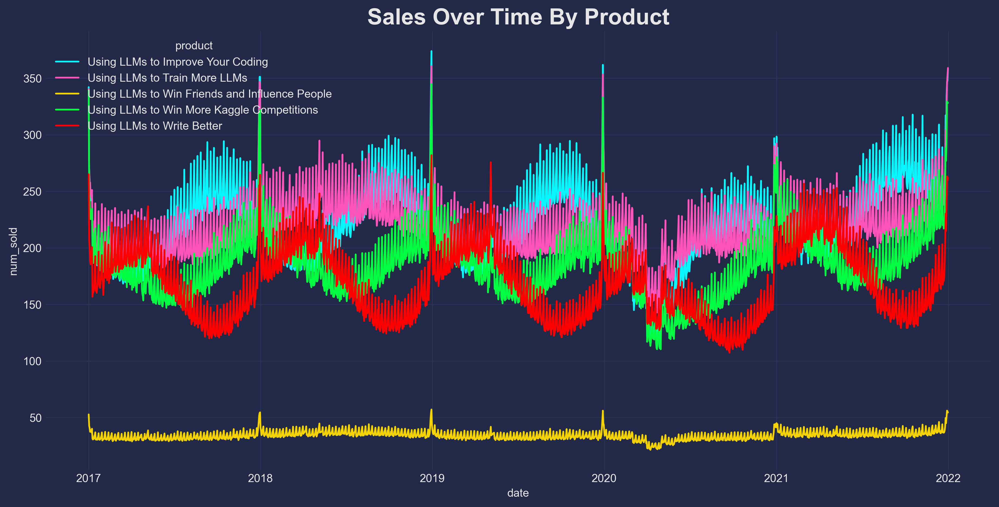

In [180]:
plt.figure(figsize=(15,7), dpi=300)
sns.lineplot(train, x="date", y="num_sold",hue = "product", errorbar=None)
plt.title("Sales Over Time By Product", fontsize=20, fontweight = "bold")
plt.show()

## Dropping the covid period

In [383]:
train = train[~((train["date"]<'2021-01-01') & (train["date"] >= '2020-03-01' ))]


In [551]:
plt.figure(figsize=(15,7), dpi=300)
sns.lineplot(train, x="date", y="num_sold",hue = "country", errorbar=None)
plt.title("Sales Over Time By Country", fontsize=20, fontweight = "bold")
plt.show()

ValueError: Could not interpret value `country` for parameter `hue`

<Figure size 4500x2100 with 0 Axes>

AttributeError: 'DataFrame' object has no attribute 'month'

# Building the model

In [181]:
import lightgbm as lgb
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import make_scorer
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

In [182]:
def smape(A,F):
    return 100/len(A) * np.sum(2 * np.abs(F - A) / (np.abs(A) + np.abs(F)))


In [183]:
my_scorer = make_scorer(smape, greater_is_better=False)


In [542]:

#Get list of major holidays for ['Argentina' 'Canada' 'Estonia' 'Japan' 'Spain'] and append to df

def get_holidays(df):

    # Analyzing country specific holidays:-
    Holidays = pd.DataFrame(columns = ['date', 'holiday_name', 'country'])
    country_list = df.country.unique()
    min_year = df.year.min()
    max_year = df.year.max()
    number_of_days = (df['date'].max() - df['date'].min()).days + 1
    date_list = [df['date'].min() + timedelta(days=day) for day in range(number_of_days)]

    if min_year == max_year:
        years = [min_year]
    else:
        years = np.arange(min_year, max_year, 1)

    for country in tqdm(country_list):
        for h in CountryHoliday(country, years = years).items():
            i=len(Holidays)
            Holidays.loc[i,'date']=h[0]
            Holidays.loc[i,'holiday_name']=h[1]
            Holidays.loc[i,'country']=country
    #print(Holidays)
    Holidays['isHoliday'] = 1

    # Merge on unique combinations of date and country
    date_country = df[['date', 'country']].drop_duplicates().reset_index(drop=True)
    date_country['date_str'] = date_country['date'].astype(str)
    Holidays['date_str'] = Holidays['date'].astype(str)
    date_country_holidays = pd.merge(date_country, Holidays[['date_str', 'country', 'isHoliday','holiday_name']], how='left', on=['date_str', 'country'])

    # Merge back to the original DataFrame
    df = pd.merge(df, date_country_holidays[['date', 'country', 'isHoliday','holiday_name']], how='left', on=['date', 'country'])
    df['isHoliday'] = df['isHoliday'].fillna(0).astype(int)
    df['holiday_name'] = df['holiday_name'].fillna('Not Holiday')

    #Add Weekend
    #df['Friday']=(df['dayname']=='Friday').astype(int)
    #df['Saturday']=(df['dayname']=='Saturday').astype(int)
    #df['Sunday']=(df['dayname']=='Sunday').astype(int)
    return df,Holidays

In [543]:
def seasonality_features(df):
    df['month_sin'] = np.sin(2*np.pi*df.month/12)
    df['month_cos'] = np.cos(2*np.pi*df.month/12)
    df['day_sin'] = np.sin(2*np.pi*df.day/24)
    df['day_cos'] = np.cos(2*np.pi*df.day/24)
    df['day_year_sin'] = np.sin(2*np.pi*df.day/365)
    df['day_year_cos'] = np.cos(2*np.pi*df.day/365)

    return df



In [572]:
def prepare_df(path, is_train):
    df = pd.read_csv(path)
    df.date = pd.to_datetime(df.date, format = '%Y-%m-%d')
    df['year'] = df['date'].dt.year
    df['month'] = df['date'].dt.month
    df['day'] = df['date'].dt.day
    df['dayofweek'] = df['date'].dt.dayofweek
    df['dayofyear'] = df['date'].dt.dayofyear

    #mean_solds =df.groupby(["dayofyear", 'country', 'store', 'product'])['num_sold'].aggregate("mean")[:22950]

    df = df[~((df["date"]<'2021-01-01') & (df["date"] >= '2020-03-01' ))]



    df, df_holidays =get_holidays(df)

    df = seasonality_features(df)


    # # Fill NA values caused by moving average
    # df = df.interpolate(method="bfill")

    # One-hot encoding
    df = pd.get_dummies(df, columns=['country', 'store', 'product'])
    df = df.drop('holiday_name', axis=1)

    if is_train:
        # Define features X and target y
        X = df.drop(['id', 'date', 'num_sold'], axis=1)
        Y = df[['num_sold']]
        return df, X, Y
    return df

In [544]:
train, X, Y = prepare_df('train.csv')

100%|██████████| 5/5 [00:00<00:00, 92.38it/s]


In [575]:
test = prepare_df('test.csv', False)

100%|██████████| 5/5 [00:00<00:00, 253.14it/s]


In [576]:
test

,id,date,year,month,day,dayofweek,dayofyear,isHoliday,month_sin,month_cos,...,country_Japan,country_Spain,store_Kagglazon,store_Kaggle Learn,store_Kaggle Store,product_Using LLMs to Improve Your Coding,product_Using LLMs to Train More LLMs,product_Using LLMs to Win Friends and Influence People,product_Using LLMs to Win More Kaggle Competitions,product_Using LLMs to Write Better
0,136950,2022-01-01,2022,1,1,5,1,1,5.000000e-01,0.866025,...,0,0,0,1,0,1,0,0,0,0
1,136951,2022-01-01,2022,1,1,5,1,1,5.000000e-01,0.866025,...,0,0,0,1,0,0,1,0,0,0
2,136952,2022-01-01,2022,1,1,5,1,1,5.000000e-01,0.866025,...,0,0,0,1,0,0,0,1,0,0
3,136953,2022-01-01,2022,1,1,5,1,1,5.000000e-01,0.866025,...,0,0,0,1,0,0,0,0,1,0
4,136954,2022-01-01,2022,1,1,5,1,1,5.000000e-01,0.866025,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27370,164320,2022-12-31,2022,12,31,5,365,0,-2.449294e-16,1.000000,...,0,1,1,0,0,1,0,0,0,0
27371,164321,2022-12-31,2022,12,31,5,365,0,-2.449294e-16,1.000000,...,0,1,1,0,0,0,1,0,0,0
27372,164322,2022-12-31,2022,12,31,5,365,0,-2.449294e-16,1.000000,...,0,1,1,0,0,0,0,1,0,0
27373,164323,2022-12-31,2022,12,31,5,365,0,-2.449294e-16,1.000000,...,0,1,1,0,0,0,0,0,1,0


In [548]:


# Splitting data into train and test sets
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, shuffle=False)

In [550]:
Y_train.columns

Index(['num_sold'], dtype='object')

In [553]:
train_data = lgb.Dataset(X_train, label=Y_train.values.ravel())
param_search = {
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [20, 40],
    'boosting_type' : ['gbdt'],
    'objective' : ['regression'],
    'random_state' : [501],
    'colsample_bytree' : [0.8, 0.1],
    'subsample' : [0.8, 1],
    'min_split_gain' : [0.01],
    'metric':['l1', 'l2'],
    'device': ['cpu'] # Enable GPU
}
tscv = TimeSeriesSplit(n_splits=5)
gsearch = GridSearchCV(lgb.LGBMRegressor(), param_grid=param_search, scoring=my_scorer, cv=tscv, n_jobs=-1, verbose=10)
gsearch.fit(X_train, Y_train.values.ravel())
# Best parameters
best_params = gsearch.best_params_
print("Best parameters: ", best_params)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001194 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 471
[LightGBM] [Info] Number of data points in the train set: 91200, number of used features: 25
[LightGBM] [Info] Start training from score 167.459375
Best parameters:  {'boosting_type': 'gbdt', 'colsample_bytree': 0.8, 'device': 'cpu', 'learning_rate': 0.1, 'metric': 'l1', 'min_split_gain': 0.01, 'n_estimators': 40, 'objective': 'regression', 'random_state': 501, 'subsample': 0.8}


In [554]:
model_lgbm = lgb.LGBMRegressor(
    boosting_type=best_params['boosting_type'],
    learning_rate=best_params['learning_rate'],
    n_estimators=best_params['n_estimators'],
    subsample=best_params['subsample'],
    colsample_bytree=best_params['colsample_bytree'],
    objective=best_params['objective'],
    random_state=best_params['random_state'],
    device=best_params['device'])

model_lgbm.fit(X_train, Y_train.values.ravel())

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001832 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 471
[LightGBM] [Info] Number of data points in the train set: 91200, number of used features: 25
[LightGBM] [Info] Start training from score 167.459375


LGBMRegressor(colsample_bytree=0.8, device='cpu', n_estimators=40,
              objective='regression', random_state=501, subsample=0.8)

In [555]:
predictions = model_lgbm.predict(X_val)

In [556]:
def model_visualisation(Y_test, predictions):
    # Create subplots with 1 row and 2 columns
    fig, axes = plt.subplots(3, 1, figsize=(16, 16))

    # Scatter plot of actual values vs predicted values
    axes[0].scatter(Y_test, predictions, alpha=0.5)
    axes[0].plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], alpha=0.5, linewidth=2)
    axes[0].set_xlabel('Actual Values')
    axes[0].set_ylabel('Predicted Values')
    axes[0].set_title('Scatter Plot: Predicted vs. Actual')
    axes[0].legend(['Reference Line', 'Predicted vs. Actual'])

    # Line plot of actual values and predicted values
    axes[1].plot(Y_test.values.ravel(), alpha=0.5, label='Actual')
    axes[1].plot(predictions, alpha=0.5, label='Predicted')
    axes[1].set_title('Line Plot: Predicted vs. Actual')
    axes[1].legend()

    axes[2].plot(Y_test.values.ravel()-predictions, alpha=0.5, label = "Difference between actual and predicted")
    axes[2].set_title('Difference between actual and predicted')
    axes[2].legend()

    plt.tight_layout()
    mplcyberpunk.add_glow_effects()

    plt.show()

    # Test set SMAPE
    print("Test set SMAPE: ", smape(Y_test.values.ravel(), predictions))
    print("Mean error: ", np.mean(abs(Y_test.values.ravel()-predictions)))

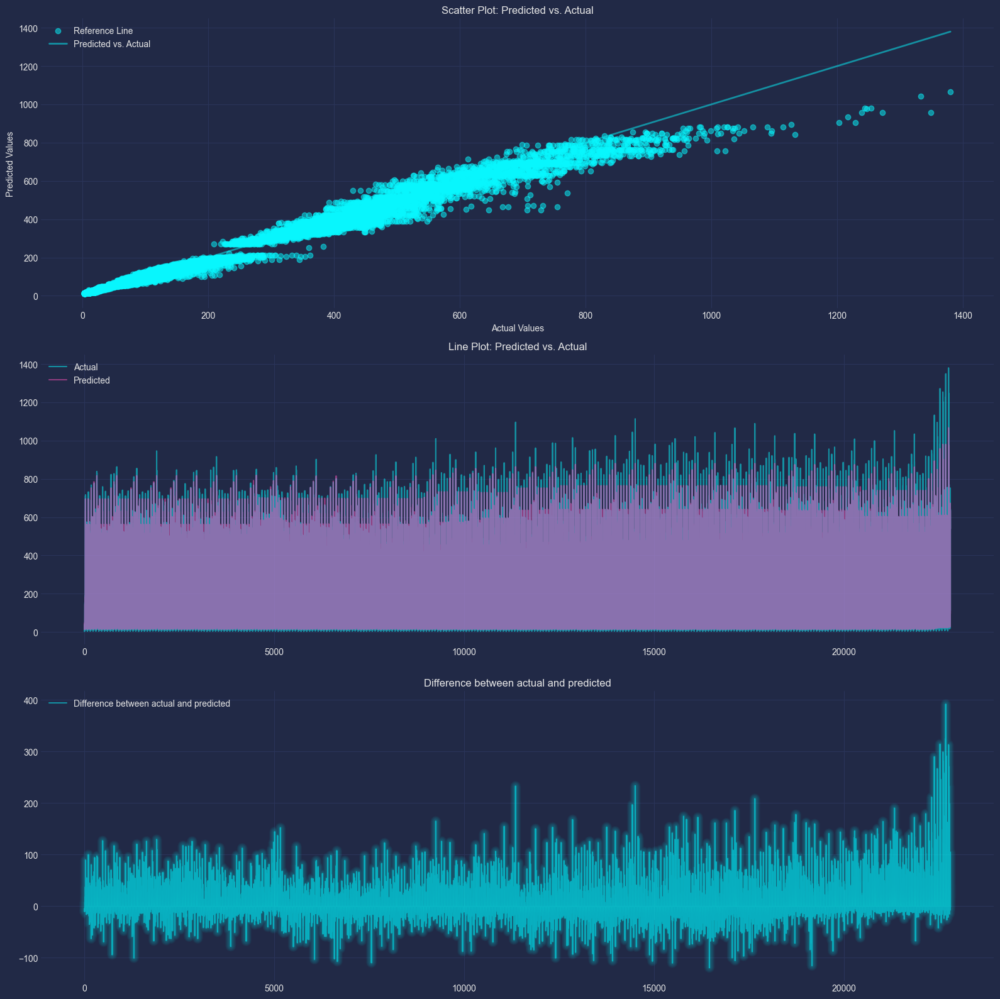

Test set SMAPE:  14.240760696466552
Mean error:  15.578906681590976


In [557]:

model_visualisation(Y_val, predictions)

In [234]:
from catboost import CatBoostRegressor


In [558]:
param_search = {'depth'         : [4,5,6,7,8,9, 10],
               'learning_rate' : [0.01,0.02,0.03,0.04],
               'iterations'    : [10, 20,30,40,50,60,70,80,90, 100]
               }
tscv = TimeSeriesSplit(n_splits=5)
gsearch = GridSearchCV(CatBoostRegressor(), param_grid=param_search, scoring=my_scorer, cv=tscv, verbose=10, n_jobs=-1)
gsearch.fit(X_train, Y_train.values.ravel())
# Best parameters
best_params = gsearch.best_params_
print("Best parameters: ", best_params)

Fitting 5 folds for each of 280 candidates, totalling 1400 fits
[CV 5/5; 1/48] START boosting_type=gbdt, colsample_bytree=0.8, device=cpu, learning_rate=0.01, metric=l1, min_split_gain=0.01, n_estimators=20, objective=regression, random_state=501, subsample=0.8
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 469
[LightGBM] [Info] Number of data points in the train set: 76000, number of used features: 25
[LightGBM] [Info] Start training from score 166.475566
[CV 5/5; 1/48] END boosting_type=gbdt, colsample_bytree=0.8, device=cpu, learning_rate=0.01, metric=l1, min_split_gain=0.01, n_estimators=20, objective=regression, random_state=501, subsample=0.8;, score=-75.349 total time=   0.9s
[CV 4/5; 3/48] START boosting_type=gbdt, colsample_bytree=0.8, device=cpu, learni

In [559]:
model_cat_boost = CatBoostRegressor(depth=8, iterations=100, learning_rate=0.04)

In [560]:
model_cat_boost.fit(X_train, Y_train.values.ravel())

0:	learn: 177.0873165	total: 8.26ms	remaining: 818ms
1:	learn: 170.4923376	total: 17.2ms	remaining: 842ms
2:	learn: 164.0835766	total: 24.6ms	remaining: 796ms
3:	learn: 157.9421675	total: 32.1ms	remaining: 771ms
4:	learn: 152.0847109	total: 39.6ms	remaining: 753ms
5:	learn: 146.4378613	total: 47.3ms	remaining: 741ms
6:	learn: 141.0497276	total: 54.5ms	remaining: 724ms
7:	learn: 135.8827635	total: 61.1ms	remaining: 702ms
8:	learn: 130.9046855	total: 67.7ms	remaining: 685ms
9:	learn: 126.2219743	total: 74ms	remaining: 666ms
10:	learn: 121.6563859	total: 82.9ms	remaining: 670ms
11:	learn: 117.3590720	total: 89.9ms	remaining: 659ms
12:	learn: 113.3073203	total: 97.5ms	remaining: 652ms
13:	learn: 109.3667239	total: 105ms	remaining: 643ms
14:	learn: 105.6619855	total: 112ms	remaining: 637ms
15:	learn: 101.9946476	total: 119ms	remaining: 626ms
16:	learn: 98.5112256	total: 127ms	remaining: 619ms
17:	learn: 95.1628684	total: 134ms	remaining: 608ms
18:	learn: 91.9306110	total: 140ms	remaining: 5

In [561]:
predictions = model_cat_boost.predict(X_val)


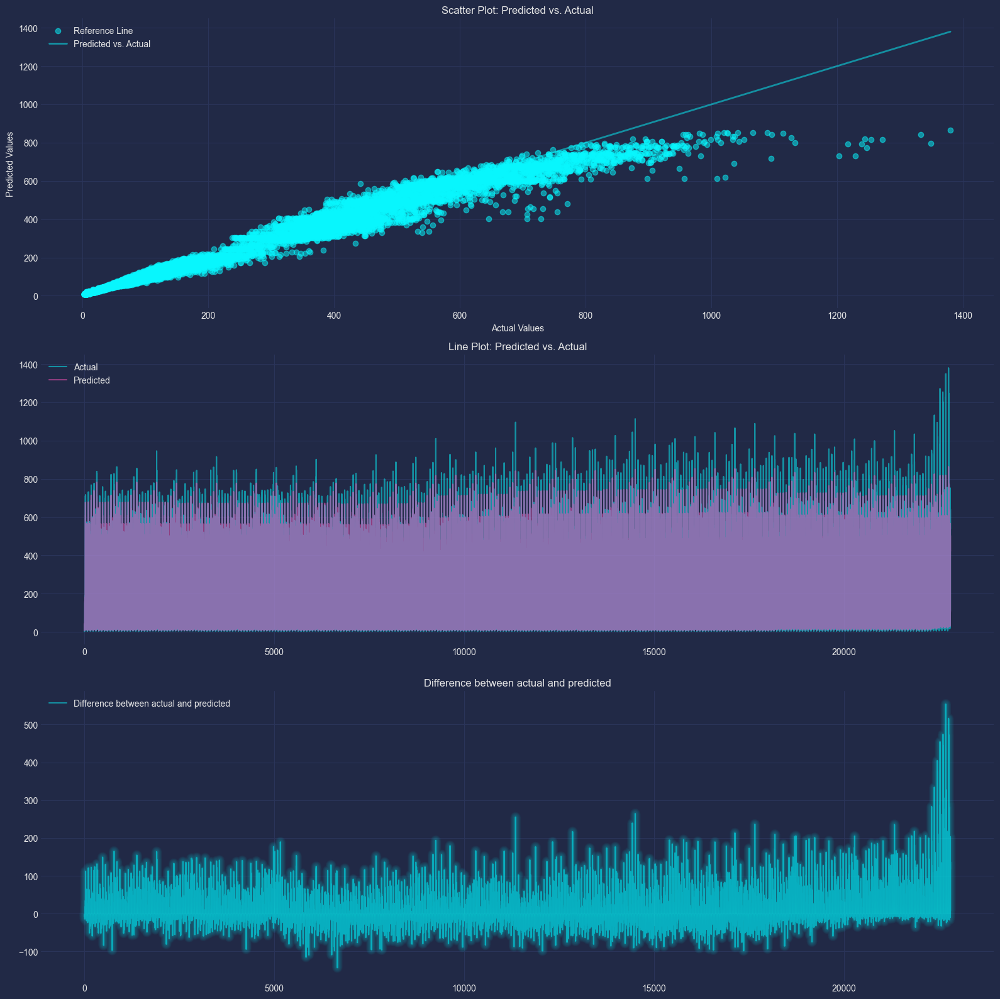

Test set SMAPE:  11.86130421559792
Mean error:  16.815569386892186


In [562]:
model_visualisation(Y_val, predictions)

In [240]:
from sklearn.ensemble import GradientBoostingRegressor

In [242]:
param_search = {'learning_rate': [0.01,0.03,0.04],
                'subsample'    : [0.9, 0.5, 0.2],
                'n_estimators' : [100,500,1000],
                'max_depth'    : [6,8,10]
                }
tscv = TimeSeriesSplit(n_splits=5)
gsearch = GridSearchCV(GradientBoostingRegressor(), param_grid=param_search, scoring=my_scorer, cv=tscv, verbose=True, n_jobs=-1)
gsearch.fit(X_train, Y_train.values.ravel())
# Best parameters
best_params = gsearch.best_params_
print("Best parameters: ", best_params)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters:  {'learning_rate': 0.01, 'max_depth': 8, 'n_estimators': 1000, 'subsample': 0.2}


In [563]:
model_gbr = GradientBoostingRegressor(learning_rate=0.01, max_depth=8, n_estimators=1000, subsample=0.2)

In [564]:
model_gbr.fit(X_train, Y_train.values.ravel())
predictions = model_gbr.predict(X_val)


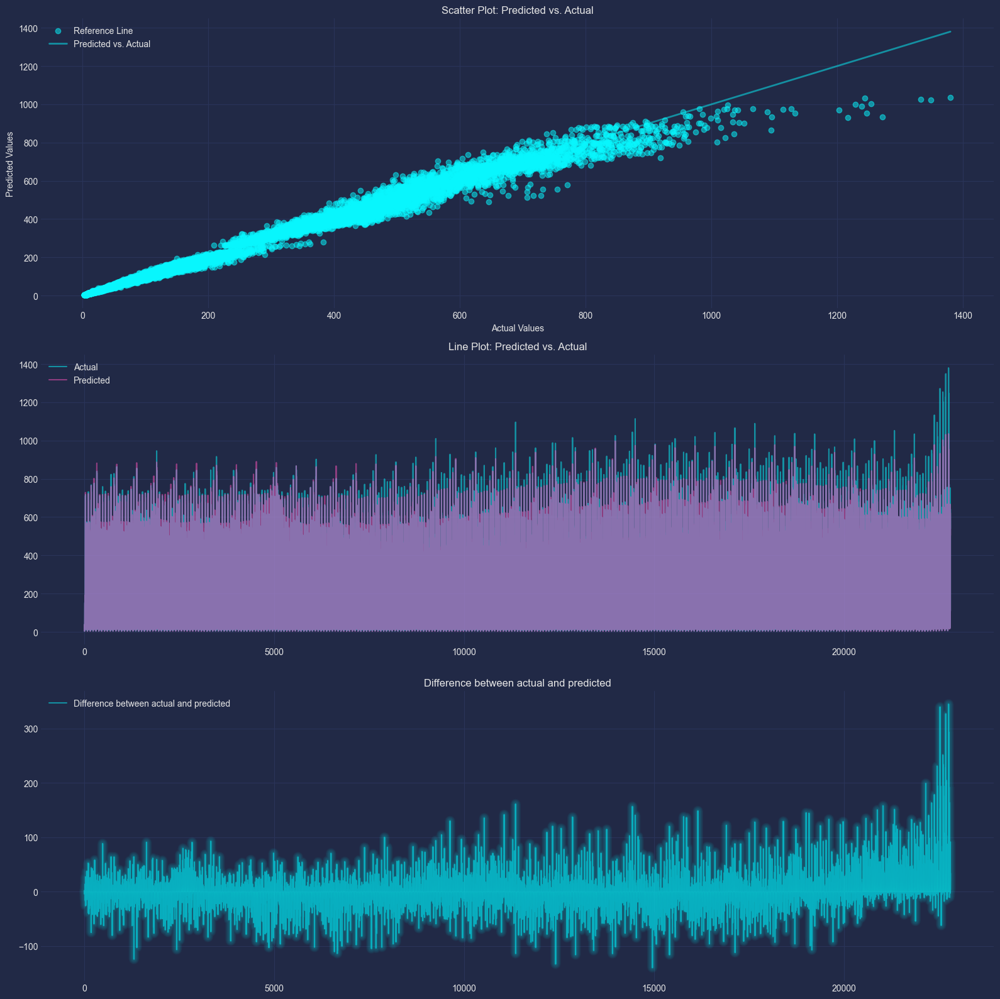

Test set SMAPE:  6.387103986251124
Mean error:  10.447128352936586


In [565]:
model_visualisation(Y_val, predictions)

In [246]:
from xgboost import XGBRegressor

In [247]:
param_search = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:linear'],
              'learning_rate': [.03, 0.05, .07], #so called `eta` value
              'max_depth': [5, 6, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.7],
              'colsample_bytree': [0.7],
              'n_estimators': [500]}

tscv = TimeSeriesSplit(n_splits=5)
gsearch = GridSearchCV(XGBRegressor(), param_grid=param_search, scoring=my_scorer, cv=tscv, verbose=15, n_jobs=-1)
gsearch.fit(X_train, Y_train.values.ravel())
# Best parameters
best_params = gsearch.best_params_
print("Best parameters: ", best_params)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[14:31:06] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[14:31:06] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "silent" } are not used.

Best parameters:  {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 7, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.7}


In [566]:
model_xgb = XGBRegressor(colsample_bytree=0.7, learning_rate=0.05, max_depth=7, min_child_weight = 4, n_estimators = 500, nthread = 4, objective='reg:linear', silent = 1, subsample = 0.7)

In [567]:
model_xgb.fit(X_train, Y_train.values.ravel())
predictions = model_xgb.predict(X_val)


[17:09:03] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/objective/regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[17:09:03] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "silent" } are not used.



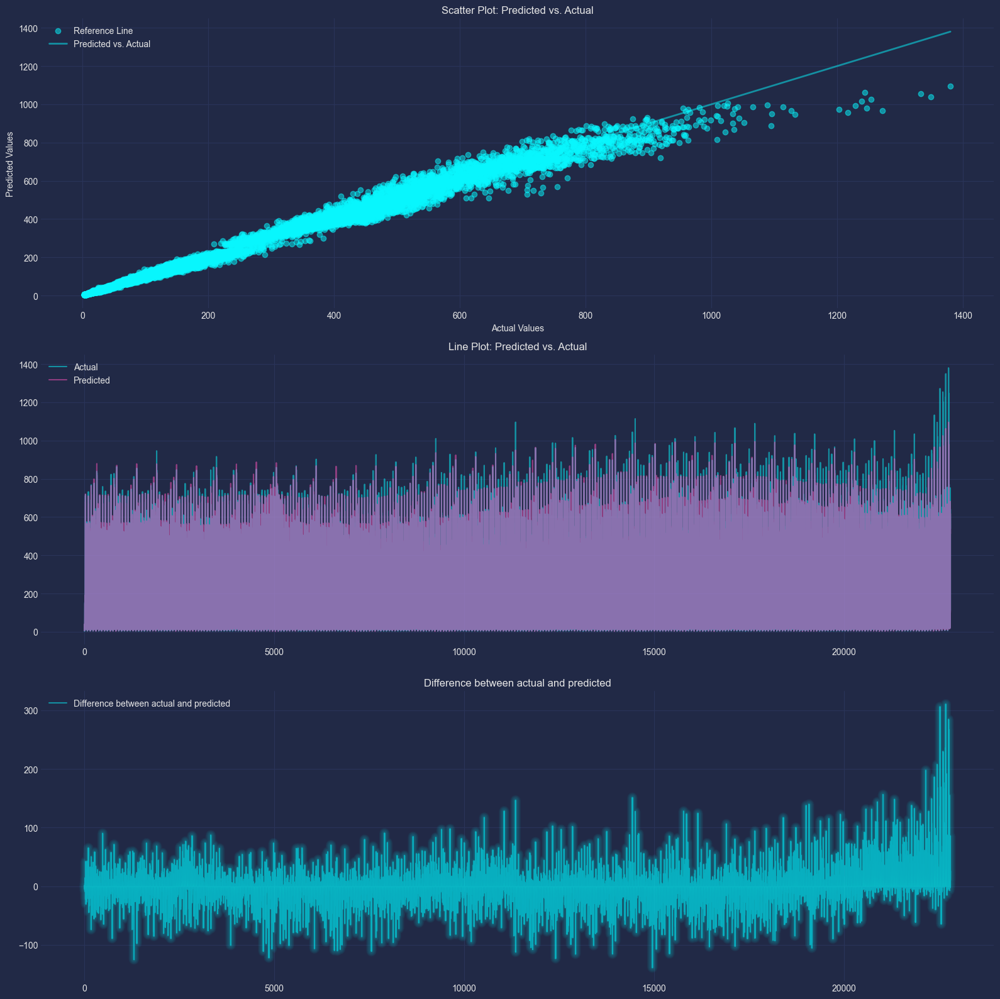

Test set SMAPE:  6.776537663354103
Mean error:  10.38516583195381


In [568]:
model_visualisation(Y_val, predictions)


In [434]:
test

,id,date,country,store,product
0,136950,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding
1,136951,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs
2,136952,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People
3,136953,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions
4,136954,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better
...,...,...,...,...,...
27370,164320,2022-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding
27371,164321,2022-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs
27372,164322,2022-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People
27373,164323,2022-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions


In [443]:
test=pd.read_csv('test.csv')
test.date = pd.to_datetime(test.date, format = '%Y-%m-%d')
test['year'] = test['date'].dt.year
test['month'] = test['date'].dt.month
test['day'] = test['date'].dt.day
test['dayofweek'] = test['date'].dt.dayofweek


# Fill NA values caused by moving average
test = test.fillna(method='bfill')

# One-hot encoding
test = pd.get_dummies(test, columns=['country', 'store', 'product'])

In [450]:
test.columns, len(test.columns)

(Index(['id', 'date', 'year', 'month', 'day', 'dayofweek', 'country_Argentina',
        'country_Canada', 'country_Estonia', 'country_Japan', 'country_Spain',
        'store_Kagglazon', 'store_Kaggle Learn', 'store_Kaggle Store',
        'product_Using LLMs to Improve Your Coding',
        'product_Using LLMs to Train More LLMs',
        'product_Using LLMs to Win Friends and Influence People',
        'product_Using LLMs to Win More Kaggle Competitions',
        'product_Using LLMs to Write Better'],
       dtype='object'),
 19)

In [577]:
def create_submission(model,test):
    ids = test.id
    test=test.drop(["id", "date"], axis=1)
    predictions = model.predict(test)
    p = pd.Series(predictions)
    p = p.astype('int')
    id_ = pd.Series(ids)
    df = pd.concat([id_, p], axis=1, ignore_index=True)
    df = df.rename(columns={0: 'id', 1: 'num_sold'})
    return df

In [578]:
df = create_submission(model_gbr, test)

In [579]:
df.to_csv("submission_gbr_23.csv", header=["id", "num_sold"], index=False, sep=",")

In [538]:
a, ax, ay = prepare_df("train.csv")

100%|██████████| 5/5 [00:00<00:00, 96.22it/s]


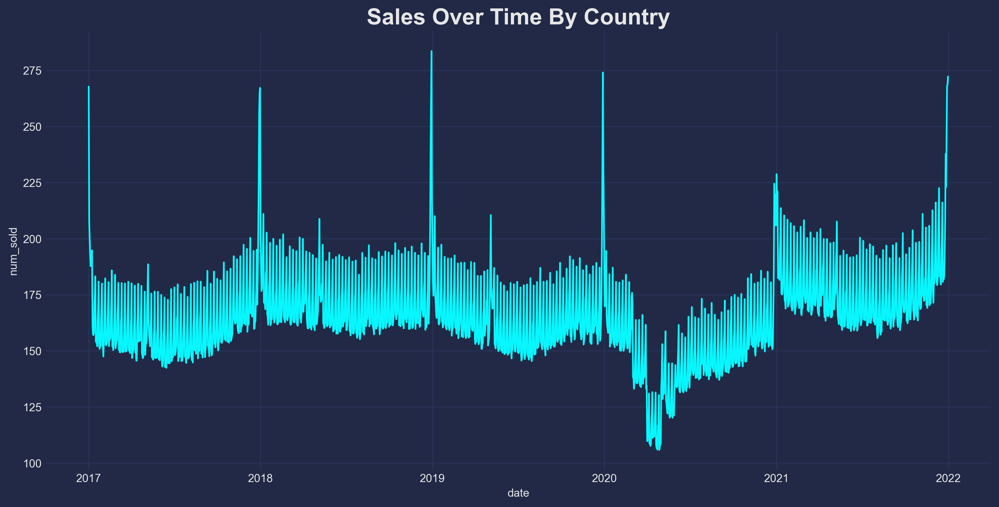

In [539]:
plt.figure(figsize=(15,7), dpi=300)
sns.lineplot(a, x="date", y="num_sold", errorbar=None)
plt.title("Sales Over Time By Country", fontsize=20, fontweight = "bold")
plt.show()

In [485]:
a.columns


Index(['id', 'date', 'num_sold', 'year', 'month', 'day', 'dayofweek',
       'isHoliday', 'month_sin', 'month_cos', 'day_sin', 'day_cos',
       'country_Argentina', 'country_Canada', 'country_Estonia',
       'country_Japan', 'country_Spain', 'store_Kagglazon',
       'store_Kaggle Learn', 'store_Kaggle Store',
       'product_Using LLMs to Improve Your Coding',
       'product_Using LLMs to Train More LLMs',
       'product_Using LLMs to Win Friends and Influence People',
       'product_Using LLMs to Win More Kaggle Competitions',
       'product_Using LLMs to Write Better'],
      dtype='object')

In [506]:
p = pd.read_csv("train.csv")
p.date= pd.to_datetime(p.date, format = '%Y-%m-%d')
p['dayofyear'] = p['date'].dt.dayofyear

In [511]:
by_date =p.groupby(["dayofyear", 'country', 'store', 'product'])['num_sold'].aggregate("mean")



In [530]:
by_date[:22950]

dayofyear  country    store         product                                       
1          Argentina  Kagglazon     Using LLMs to Improve Your Coding                 224.6
                                    Using LLMs to Train More LLMs                     221.2
                                    Using LLMs to Win Friends and Influence People     34.0
                                    Using LLMs to Win More Kaggle Competitions        218.0
                                    Using LLMs to Write Better                        175.2
                                                                                      ...  
306        Spain      Kaggle Store  Using LLMs to Improve Your Coding                 138.2
                                    Using LLMs to Train More LLMs                     125.0
                                    Using LLMs to Win Friends and Influence People     18.6
                                    Using LLMs to Win More Kaggle Competitions        109

In [523]:
mean_solds=np.array(by_date).astype(int)

In [525]:
len(mean_solds)

27450

In [507]:
p

,id,date,country,store,product,num_sold,dayofyear
0,0,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,63,1
1,1,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,66,1
2,2,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,9,1
3,3,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,59,1
4,4,2017-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better,49,1
...,...,...,...,...,...,...,...
136945,136945,2021-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding,700,365
136946,136946,2021-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs,752,365
136947,136947,2021-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People,111,365
136948,136948,2021-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions,641,365


In [531]:
without_c = p[((p["date"]<'2021-01-01') & (p["date"] >= '2020-03-01' ))].num_sold=np.array(mean_solds).astype('int')[:22950]


In [528]:
p[((p["date"]<'2021-01-01') & (p["date"] >= '2020-03-01' ))]

,id,date,country,store,product,num_sold,dayofyear
86625,86625,2020-03-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding,24,61
86626,86626,2020-03-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs,28,61
86627,86627,2020-03-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People,4,61
86628,86628,2020-03-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions,25,61
86629,86629,2020-03-01,Argentina,Kaggle Learn,Using LLMs to Write Better,22,61
...,...,...,...,...,...,...,...
109570,109570,2020-12-31,Spain,Kagglazon,Using LLMs to Improve Your Coding,560,366
109571,109571,2020-12-31,Spain,Kagglazon,Using LLMs to Train More LLMs,590,366
109572,109572,2020-12-31,Spain,Kagglazon,Using LLMs to Win Friends and Influence People,83,366
109573,109573,2020-12-31,Spain,Kagglazon,Using LLMs to Win More Kaggle Competitions,532,366


In [533]:
without_c

array([224, 221,  34, ...,  18, 109,  75])